## Packages

In [1]:
import os
import zipfile
import shutil
from PIL import Image
import random
import matplotlib.pyplot as plt
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback

## Download and Preprocess the Dataset

### download the dataset

In [2]:
!wget -P /content/leaf-segmentation/raw-dataset http://liris.univ-lyon2.fr/reves/documents/Extrait_Pl@ntLeaveI_segmente_manuellement.zip

--2023-09-29 00:17:12--  http://liris.univ-lyon2.fr/reves/documents/Extrait_Pl@ntLeaveI_segmente_manuellement.zip
Resolving liris.univ-lyon2.fr (liris.univ-lyon2.fr)... 159.84.143.100
Connecting to liris.univ-lyon2.fr (liris.univ-lyon2.fr)|159.84.143.100|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 42226533 (40M) [application/zip]
Saving to: ‘/content/leaf-segmentation/raw-dataset/Extrait_Pl@ntLeaveI_segmente_manuellement.zip’

Extrait_Pl@ntLeaveI 100%[===================>]  40.27M  8.94MB/s    in 5.8s    

2023-09-29 00:17:18 (6.91 MB/s) - ‘/content/leaf-segmentation/raw-dataset/Extrait_Pl@ntLeaveI_segmente_manuellement.zip’ saved [42226533/42226533]



In [3]:
zip_file_path = "/content/leaf-segmentation/raw-dataset/Extrait_Pl@ntLeaveI_segmente_manuellement.zip"


destination_directory = "/content/leaf-segmentation/raw-dataset/"

# Create the extract directory if it doesn't exist
os.makedirs(destination_directory, exist_ok=True)

# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(destination_directory)

print("Extraction completed successfully.")

Extraction completed successfully.


### split the raw dataset into images and masks

In [4]:
# Set the paths
raw_dataset_folder = "/content/leaf-segmentation/raw-dataset"
images_folder = os.path.join(raw_dataset_folder, "images")
masks_folder = os.path.join(raw_dataset_folder, "masks")

# Create the "images" and "masks" folders
os.makedirs(images_folder, exist_ok=True)
os.makedirs(masks_folder, exist_ok=True)

# Get the path of the "Extrait_Pl@ntLeaveI_segmente_manuellement" folder
extrait_folder = os.path.join(raw_dataset_folder, "Extrait_Pl@ntLeaveI_segmente_manuellement")

# Get the list of image files
image_files = []
mask_files = []
for file_name in os.listdir(extrait_folder):
    if file_name.endswith("s.jpg"):
        mask_files.append(file_name)
    elif file_name.endswith(".jpg"):
        image_files.append(file_name)

# Move image files to the "images" folder
for image_file in image_files:
    image_src = os.path.join(extrait_folder, image_file)
    image_dest = os.path.join(images_folder, image_file)
    shutil.copy(image_src, image_dest)

# Move mask files to the "masks" folder
for mask_file in mask_files:
    mask_src = os.path.join(extrait_folder, mask_file)
    mask_dest = os.path.join(masks_folder, mask_file)
    shutil.copy(mask_src, mask_dest)

print("Copying images and masks completed successfully.")

# Remove all files and folders inside the "raw_dataset" directory, except for "images", "masks", and "Extrait_Pl@ntLeaveI_segmente_manuellement.zip"
for file_name in os.listdir(raw_dataset_folder):
    file_path = os.path.join(raw_dataset_folder, file_name)
    if file_name != "images" and file_name != "masks" and file_name != "Extrait_Pl@ntLeaveI_segmente_manuellement.zip":
        if os.path.isfile(file_path):
            os.remove(file_path)
        elif os.path.isdir(file_path):
            shutil.rmtree(file_path)

print("Unnecessary files and folders removed.")

# Print the number of images and masks
num_images = len(os.listdir(images_folder))
num_masks = len(os.listdir(masks_folder))
print(f"Number of images: {num_images}")
print(f"Number of masks: {num_masks}")

Copying images and masks completed successfully.
Unnecessary files and folders removed.
Number of images: 233
Number of masks: 233


In [5]:
def calculate_max_min_dims(directory):
    max_w_dim = 0
    max_h_dim = 0
    min_w_dim = 10000
    min_h_dim = 10000

    # Iterate over the images in the directory
    for image_name in os.listdir(directory):
        image_path = os.path.join(directory, image_name)
        img = Image.open(image_path)
        width, height = img.size
        max_w_dim = max(max_w_dim, width)
        max_h_dim = max(max_h_dim, height)
        min_w_dim = min(min_w_dim, width)
        min_h_dim = min(min_h_dim, height)


    sizes = (max_w_dim, max_h_dim, min_w_dim, min_h_dim)
    return sizes

In [6]:
images_dir = '/content/leaf-segmentation/raw-dataset/images'
print(f'max_w_dim, max_h_dim, min_w_dim, min_h_dim for images are: {calculate_max_min_dims(images_dir)}')

max_w_dim, max_h_dim, min_w_dim, min_h_dim for images are: (800, 800, 161, 173)


### split the images and masks into train, dev and test

In [7]:
# Set the paths
leaf_segmentation_folder = "/content/leaf-segmentation"
dataset_folder = os.path.join(leaf_segmentation_folder, "dataset")
raw_dataset_folder = os.path.join(leaf_segmentation_folder, "raw-dataset")
train_folder = os.path.join(dataset_folder, "train")
dev_folder = os.path.join(dataset_folder, "dev")
test_folder = os.path.join(dataset_folder, "test")

# Remove existing train, dev, and test folders if they exist
shutil.rmtree(train_folder, ignore_errors=True)
shutil.rmtree(dev_folder, ignore_errors=True)
shutil.rmtree(test_folder, ignore_errors=True)

# Create the train, dev, and test folders
os.makedirs(train_folder, exist_ok=True)
os.makedirs(dev_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

# Set the paths for train, dev, and test images and masks
train_images_folder = os.path.join(train_folder, "images", "img")
train_masks_folder = os.path.join(train_folder, "masks", "img")
dev_images_folder = os.path.join(dev_folder, "images", "img")
dev_masks_folder = os.path.join(dev_folder, "masks", "img")
test_images_folder = os.path.join(test_folder, "images", "img")
test_masks_folder = os.path.join(test_folder, "masks", "img")

# Create images and masks folders within train, dev, and test directories
os.makedirs(train_images_folder, exist_ok=True)
os.makedirs(train_masks_folder, exist_ok=True)
os.makedirs(dev_images_folder, exist_ok=True)
os.makedirs(dev_masks_folder, exist_ok=True)
os.makedirs(test_images_folder, exist_ok=True)
os.makedirs(test_masks_folder, exist_ok=True)

# Copy images and masks to the test set
test_start_index = 3977
test_end_index = 4903
for i in range(test_start_index, test_end_index + 1):
    image_filename = str(i) + ".jpg"
    mask_filename = str(i) + "s.jpg"
    image_src = os.path.join(raw_dataset_folder, "images", image_filename)
    mask_src = os.path.join(raw_dataset_folder, "masks", mask_filename)
    image_dest = os.path.join(test_images_folder, image_filename)
    mask_dest = os.path.join(test_masks_folder, mask_filename)
    if os.path.exists(image_src):
        shutil.copy(image_src, image_dest)
        shutil.copy(mask_src, mask_dest)

# Obtain the remaining images (excluding the ones copied to the test set)
remaining_images = []
for image in os.listdir(os.path.join(raw_dataset_folder, "images")):
    image_filename = image[:-4]
    if int(image_filename) < test_start_index or int(image_filename) > test_end_index:
        remaining_images.append(image)

# Randomly split the remaining images into train and dev sets
random.shuffle(remaining_images)
num_train = int(0.9 * len(remaining_images))
train_images = remaining_images[:num_train]
dev_images = remaining_images[num_train:]

# Copy train images and masks to the train set
for image in train_images:
    image_src = os.path.join(raw_dataset_folder, "images", image)
    mask_src = os.path.join(raw_dataset_folder, "masks", image[:-4] + "s.jpg")
    image_dest = os.path.join(train_images_folder, image)
    mask_dest = os.path.join(train_masks_folder, image[:-4] + "s.jpg")
    shutil.copy(image_src, image_dest)
    shutil.copy(mask_src, mask_dest)

# Move dev images and masks to the dev set
for image in dev_images:
    image_src = os.path.join(raw_dataset_folder, "images", image)
    mask_src = os.path.join(raw_dataset_folder, "masks", image[:-4] + "s.jpg")
    image_dest = os.path.join(dev_images_folder, image)
    mask_dest = os.path.join(dev_masks_folder, image[:-4] + "s.jpg")
    shutil.copy(image_src, image_dest)
    shutil.copy(mask_src, mask_dest)

print("Images and masks copied to train, dev, and test sets successfully.")

# Print the number of images and masks in each folder
train_num_images = len(os.listdir(train_images_folder))
train_num_masks = len(os.listdir(train_masks_folder))
dev_num_images = len(os.listdir(dev_images_folder))
dev_num_masks = len(os.listdir(dev_masks_folder))
test_num_images = len(os.listdir(test_images_folder))
test_num_masks = len(os.listdir(test_masks_folder))

print(f"Train set - Number of images: {train_num_images}, Number of masks: {train_num_masks}")
print(f"Dev set - Number of images: {dev_num_images}, Number of masks: {dev_num_masks}")
print(f"Test set - Number of images: {test_num_images}, Number of masks: {test_num_masks}")

Images and masks copied to train, dev, and test sets successfully.
Train set - Number of images: 177, Number of masks: 177
Dev set - Number of images: 20, Number of masks: 20
Test set - Number of images: 36, Number of masks: 36


## Visualization Functions

In [8]:
def display_image_with_mask(image, mask):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(image)
    ax1.set_title('Image')
    ax1.axis('off')
    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')
    ax2.axis('off')
    plt.show()


def display_image_with_true_and_predicted_masks(image, true_mask, predicted_mask):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    ax1.imshow(image)
    ax1.set_title('Image')
    ax1.axis('off')
    ax2.imshow(true_mask, cmap='gray')
    ax2.set_title('True Mask')
    ax2.axis('off')
    ax3.imshow(predicted_mask, cmap='gray')
    ax3.set_title('Predicted Mask')
    ax3.axis('off')
    plt.show()



def display_images_with_masks(images, true_masks, predicted_masks, titles=None):
    num_images = len(images)

    # Calculate the number of rows and columns in the plot
    num_rows = num_images
    num_cols = 3

    # Create the plot with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_images))

    # Iterate over each image and its corresponding masks
    for i in range(num_images):
        image = images[i]
        true_mask = true_masks[i]
        predicted_mask = predicted_masks[i]

        # Get the corresponding axes for the current row
        if num_rows > 1:
            ax1, ax2, ax3 = axes[i]
        else:
            ax1, ax2, ax3 = axes

        # Display the image
        ax1.imshow(image)
        ax1.set_title('Image')

        # Display the true mask
        ax2.imshow(true_mask, cmap='gray')
        ax2.set_title('True Mask')

        # Display the predicted mask
        ax3.imshow(predicted_mask, cmap='gray')
        ax3.set_title('Predicted Mask')

        # Turn off the axis labels
        ax1.axis('off')
        ax2.axis('off')
        ax3.axis('off')

        # Set the title for the current row if provided
        if titles is not None:
            ax1.set_title(titles[i])

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()


def plot_accuracies(true_masks, preds_masks):
    # Calculate accuracy for each image
    accuracies = []

    # Create an instance of tf.keras.metrics.Accuracy
    accuracy_metric = tf.keras.metrics.Accuracy()
    for i in range(len(true_masks)):
        true_mask = true_masks[i]
        pred_mask = preds_masks[i]

        # Update the metric with the true and predicted labels
        accuracy_metric.update_state(true_mask, pred_mask)
        # Get the accuracy value
        accuracy = accuracy_metric.result().numpy()

        accuracies.append(accuracy)
        print(f"Accuracy for image {i+1}: {round(accuracy*100, 2)}%")

    # Calculate the overall accuracy
    overall_accuracy = np.mean(accuracies)
    print(f"Overall accuracy: {round(overall_accuracy*100, 2)}%")

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, len(accuracies) + 1), accuracies)
    plt.axhline(overall_accuracy, color='red', linestyle='--', label=f'Overall Accuracy: {round(overall_accuracy*100, 2)}%')
    plt.xlabel('Image')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Image')
    plt.legend()
    plt.show()



def display_masked_image_object_detection_style(image, mask):
    '''This function draws a red line around the leaf'''
    # Convert the mask to grayscale
    mask = np.uint8(mask)

    # Apply Gaussian blur to the mask to get smooth edges
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)

    # Apply the Laplacian edge detection on the blurred mask
    edges = cv2.Laplacian(blurred, cv2.CV_8U)

    # Perform dilation on the edges
    dilated_edges = cv2.dilate(edges, None, iterations=1)

    # Create an RGB image from the dilated edges
    dilated_edges_rgb = cv2.cvtColor(dilated_edges, cv2.COLOR_GRAY2RGB)
    dilated_edges_rgb[dilated_edges > 0] = (255, 0, 0)

    # Convert the dilated_edges_rgb to the same data type as image
    dilated_edges_rgb = dilated_edges_rgb.astype(image.dtype)

    # Add the dilated_edges_rgb image to the original image
    output_image = cv2.addWeighted(image, 1, dilated_edges_rgb, 1, 0)

    # Display the masked image
    plt.imshow(output_image)
    plt.axis('off')
    plt.show()

## Set Hyperparameters

In [9]:
TRAIN_PATH = '/content/leaf-segmentation/dataset/train'
DEV_PATH = '/content/leaf-segmentation/dataset/dev'
TEST_PATH = '/content/leaf-segmentation/dataset/test'
INPUT_SIZE = (256, 256)
BATCH_SIZE = 8
SEED = 42

EPOCHS = 250
STEPS_PER_EPOCH = 23
LR = 0.0002
HIGHEST_ACC_FOR_CALL_BACK = 0.98

## Load the preparde dataset

In [10]:
# Create the ImageDataGenerator for train, dev, and test images and masks
train_image_data_gen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    horizontal_flip=True,
    vertical_flip=True
)
train_mask_data_gen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    horizontal_flip=True,
    vertical_flip=True
)
dev_image_data_gen = ImageDataGenerator(rescale=1.0 / 255.0)
dev_mask_data_gen = ImageDataGenerator(rescale=1.0 / 255.0)
test_image_data_gen = ImageDataGenerator(rescale=1.0 / 255.0)
test_mask_data_gen = ImageDataGenerator(rescale=1.0 / 255.0)


# Use the target size and class mode in the ImageDataGenerator for train images and masks
train_image_generator = train_image_data_gen.flow_from_directory(
    directory=os.path.join(TRAIN_PATH, 'images'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    shuffle=True,
    seed=42
)
train_mask_generator = train_mask_data_gen.flow_from_directory(
    directory=os.path.join(TRAIN_PATH, 'masks'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=42
)

# Use the target size and class mode in the ImageDataGenerator for dev images and masks
dev_image_generator = dev_image_data_gen.flow_from_directory(
    directory=os.path.join(DEV_PATH, 'images'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    shuffle=True,
    seed=42
)
dev_mask_generator = dev_mask_data_gen.flow_from_directory(
    directory=os.path.join(DEV_PATH, 'masks'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=42
)

# Use the target size and class mode in the ImageDataGenerator for test images and masks
test_image_generator = test_image_data_gen.flow_from_directory(
    directory=os.path.join(TEST_PATH, 'images'),
    target_size=INPUT_SIZE,
    batch_size=36,
    class_mode=None,
    shuffle=False  # No need to shuffle test data
)
test_mask_generator = test_mask_data_gen.flow_from_directory(
    directory=os.path.join(TEST_PATH, 'masks'),
    target_size=INPUT_SIZE,
    batch_size=36,
    class_mode=None,
    color_mode='grayscale',
    shuffle=False  # No need to shuffle test data
)

def preprocess_mask(mask):
    mask[mask > 0] = 1
    mask = np.logical_not(mask).astype(mask.dtype)
    return mask

train_mask_generator = (preprocess_mask(mask) for mask in train_mask_generator)
dev_mask_generator = (preprocess_mask(mask) for mask in dev_mask_generator)

# Create the train, dev, and test generators
train_generator = zip(train_image_generator, train_mask_generator)
dev_generator = zip(dev_image_generator, dev_mask_generator)
test_generator = zip(test_image_generator, test_mask_generator)

Found 177 images belonging to 1 classes.
Found 177 images belonging to 1 classes.
Found 20 images belonging to 1 classes.
Found 20 images belonging to 1 classes.
Found 36 images belonging to 1 classes.
Found 36 images belonging to 1 classes.


### Visualize a random image and its mask

In [11]:
# Get a random batch of images and masks from the train generator
images, masks = next(train_generator)

# Choose a random index from the batch
random_index = np.random.randint(0, len(images))

# Get the random image and its mask
image = images[random_index]
mask = masks[random_index]

In [12]:
image.shape, mask.shape

((256, 256, 3), (256, 256, 1))

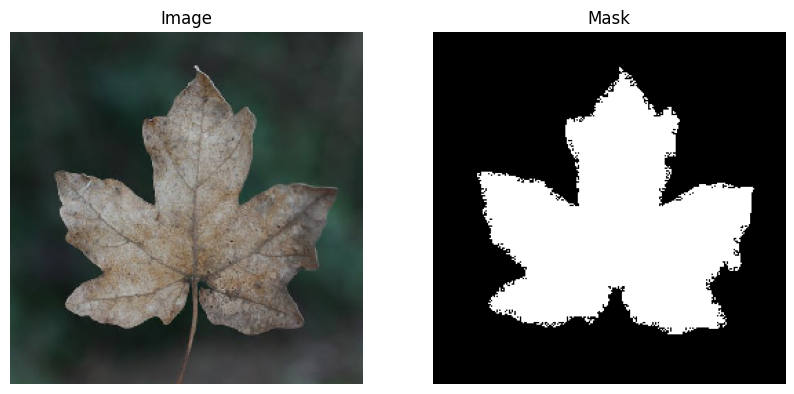

In [13]:
display_image_with_mask(image, mask)

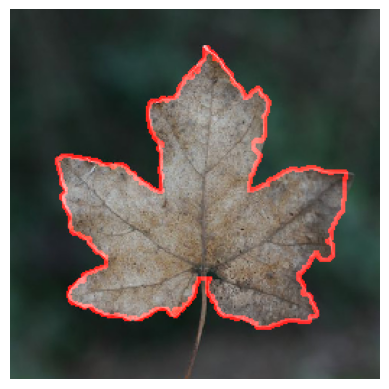

In [14]:
display_masked_image_object_detection_style(image, mask)

## Segmentation with U-Net Architecture model

### define the model

In [15]:
# Define the U-Net model
def unet(input_size):
    # Input layer
    inputs = Input(shape=input_size)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Decoder
    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = Conv2D(512, 2, activation='relu', padding='same')(up6)
    merge6 = concatenate([conv4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = Conv2D(256, 2, activation='relu', padding='same')(up7)
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = UpSampling2D(size=(2, 2))(conv7)
    up8 = Conv2D(128, 2, activation='relu', padding='same')(up8)
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = UpSampling2D(size=(2, 2))(conv8)
    up9 = Conv2D(64, 2, activation='relu', padding='same')(up9)
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    # Output layer
    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

    # Create the model
    model = Model(inputs=inputs, outputs=conv10)

    return model

In [16]:
model = unet((INPUT_SIZE + (3,)))

In [17]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

### compile the model

In [18]:
optimizer = Adam(learning_rate=LR)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

### Define a callback

In [19]:
class AccuracyCallback(Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') >= HIGHEST_ACC_FOR_CALL_BACK:
            print(f"\nTraining accuracy reached {HIGHEST_ACC_FOR_CALL_BACK}%!")
            self.model.stop_training = True
callback = AccuracyCallback()

### Train the model

In [ ]:
history = model.fit(train_generator, steps_per_epoch=STEPS_PER_EPOCH, epochs=EPOCHS, validation_data=dev_generator, validation_steps=STEPS_PER_EPOCH, verbose=1, callbacks=[callback])

Epoch 1/250
 6/23 [======>.......................] - ETA: 9s - loss: 0.6918 - accuracy: 0.5653

23/23 [==============================] - 53s 990ms/step - loss: 0.6805 - accuracy: 0.6671 - val_loss: 0.6436 - val_accuracy: 0.6776
Epoch 2/250
23/23 [==============================] - 16s 704ms/step - loss: 0.5280 - accuracy: 0.7482 - val_loss: 0.3985 - val_accuracy: 0.8111
Epoch 3/250
23/23 [==============================] - 18s 783ms/step - loss: 0.3889 - accuracy: 0.8315 - val_loss: 0.3694 - val_accuracy: 0.8618
Epoch 4/250
23/23 [==============================] - 16s 700ms/step - loss: 0.3190 - accuracy: 0.8714 - val_loss: 0.2885 - val_accuracy: 0.8924
Epoch 5/250
23/23 [==============================] - 17s 766ms/step - loss: 0.2694 - accuracy: 0.8934 - val_loss: 0.2795 - val_accuracy: 0.9018
Epoch 6/250
23/23 [==============================] - 17s 764ms/step - loss: 0.2900 - accuracy: 0.8982 - val_loss: 0.2223 - val_accuracy: 0.9142
Epoch 7/250
23/23 [==============================] - 17s 767ms/step - loss: 0.2468 - accuracy: 0.9040 - val_loss: 0.2094 - val_accuracy: 0.9229
Epoc

### Save the trained model

In [22]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model.save('/content/drive/MyDrive/leaf-segmentation/model.h5')

### Load the model if saved file available

In [25]:
!gdown --id 1-3JVZVO2E-KiO0YXsWkiRpXV8nLv1aCZ

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1-3JVZVO2E-KiO0YXsWkiRpXV8nLv1aCZ
To: /content/model.h5
100% 373M/373M [00:05<00:00, 67.6MB/s]


In [26]:
model.load_weights('/content/model.h5')

## Postprocess
Apply opening mask on the predicted masks to reduce noise

In [27]:
def apply_morphological_operations(preds_masks):
    n = preds_masks.shape[0]
    output_masks = np.zeros_like(preds_masks)

    for i in range(n):
        pred_mask = preds_masks[i, :, :, 0]

        # Convert mask to uint8
        pred_mask = np.uint8(pred_mask)


        # Apply morphological open on the mask
        kernel = np.ones((7, 7), dtype=np.uint8)
        opened_mask = cv2.morphologyEx(pred_mask, cv2.MORPH_OPEN, kernel=kernel)
        closed_mask = cv2.morphologyEx(opened_mask, cv2.MORPH_CLOSE, kernel=kernel)


        # Fill the opened mask
        filled_mask = closed_mask.copy()
        height, width = filled_mask.shape[:2]
        seed_point = (0, 0)  # Seed point for flood fill
        cv2.floodFill(filled_mask, None, seed_point, 255)

        # Set all the pixels to 1 where the filled mask has a value of 255
        filled_mask = np.where(filled_mask == 255, 1, 0)

        # Expand dimensions to match the original shape
        pred_mask_improved = np.expand_dims(filled_mask, axis=-1)

        output_masks[i] = pred_mask_improved

    return output_masks

## Predicion on test generator

In [28]:
# Get a batch of validation images and masks
test_images, test_masks = next(test_generator)

# Make predictions
preds_masks = model.predict(test_images)

# Threshold the predictions
threshold = 0.5
preds_masks[preds_masks >= threshold] = 1
preds_masks[preds_masks < threshold] = 0

2/2 [==============================] - 26s 3s/step


In [29]:
preds_masks_improved = apply_morphological_operations(preds_masks)

Accuracy for image 1: 96.11%
Accuracy for image 2: 95.48%
Accuracy for image 3: 96.21%
Accuracy for image 4: 95.86%
Accuracy for image 5: 95.98%
Accuracy for image 6: 96.19%
Accuracy for image 7: 96.47%
Accuracy for image 8: 96.38%
Accuracy for image 9: 95.57%
Accuracy for image 10: 95.81%
Accuracy for image 11: 95.78%
Accuracy for image 12: 95.39%
Accuracy for image 13: 95.55%
Accuracy for image 14: 95.62%
Accuracy for image 15: 95.45%
Accuracy for image 16: 95.38%
Accuracy for image 17: 95.41%
Accuracy for image 18: 95.49%
Accuracy for image 19: 95.68%
Accuracy for image 20: 95.54%
Accuracy for image 21: 95.63%
Accuracy for image 22: 95.67%
Accuracy for image 23: 95.8%
Accuracy for image 24: 95.93%
Accuracy for image 25: 95.44%
Accuracy for image 26: 95.44%
Accuracy for image 27: 95.54%
Accuracy for image 28: 95.51%
Accuracy for image 29: 95.54%
Accuracy for image 30: 95.54%
Accuracy for image 31: 95.5%
Accuracy for image 32: 95.47%
Accuracy for image 33: 95.4%
Accuracy for image 34:

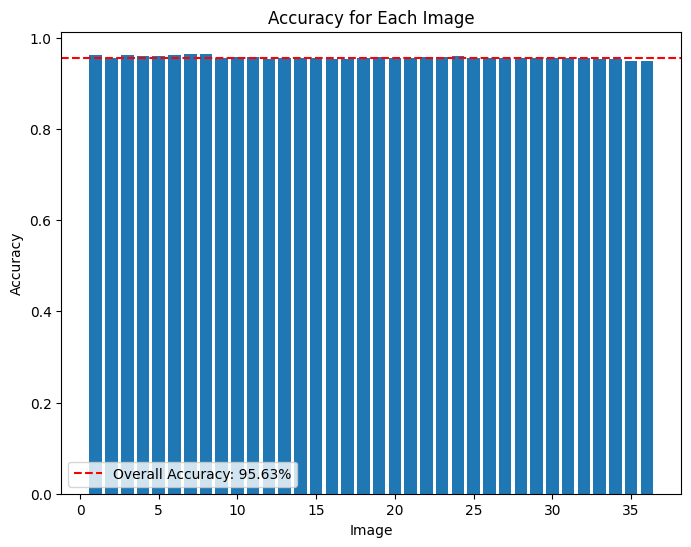

In [30]:
plot_accuracies(test_masks, preds_masks_improved)

In [31]:
file_names = os.listdir('/content/leaf-segmentation/dataset/test/images/img')
file_names = sorted(file_names)

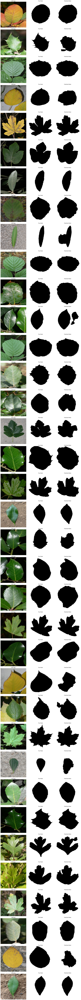

In [32]:
display_images_with_masks(test_images, test_masks, preds_masks_improved, titles=file_names)